In [34]:
import numpy as np
import pdr
from rich import print
import matplotlib.pyplot as plt
from scipy.stats import anderson
from astropy.visualization import ZScaleInterval
import itertools
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm
from PIL import Image



In [ ]:
image_data = pdr.read('test_data/e23456/e23456-nd-ffull-b00-image-r.fits')
movie_data = pdr.read('test_data/e23456/e23456-nd-f0060-b00-movie-r.fits')
#np.shape(movie),np.shape(image)
image = image_data['COUNT']
exptime = image_data['COUNT_HEADER']['XPOSURE']
movie = movie_data['COUNT']
exptimes = [movie_data['COUNT_HEADER'][f'EXPT_{i}'] for i in range(movie_data['COUNT_HEADER']['NAXIS3'])]

In [25]:
f,n,m = np.shape(movie)

  0%|          | 0/29 [00:00<?, ?it/s]

100%|██████████| 29/29 [00:21<00:00,  1.33it/s]


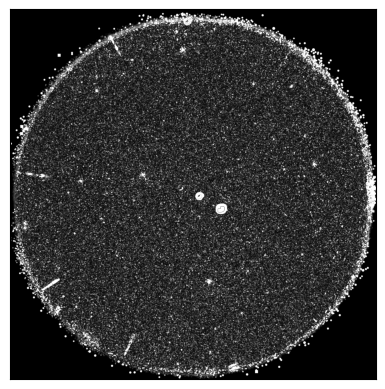

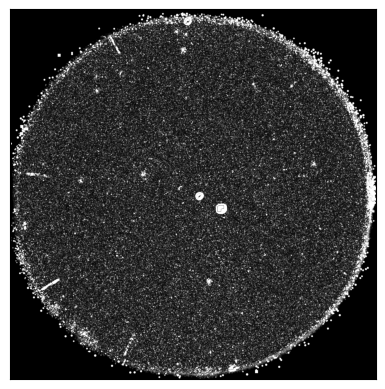

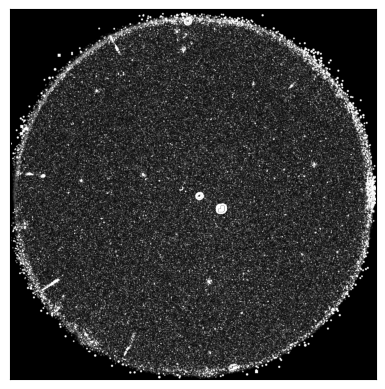

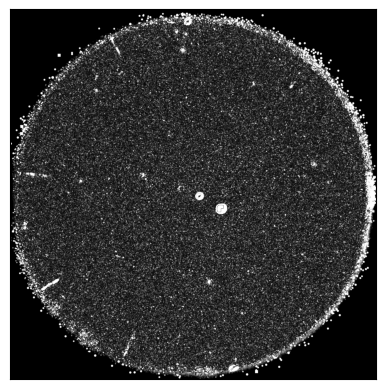

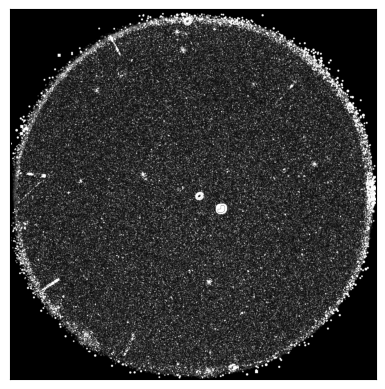

...

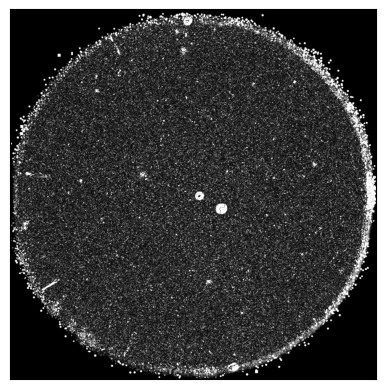

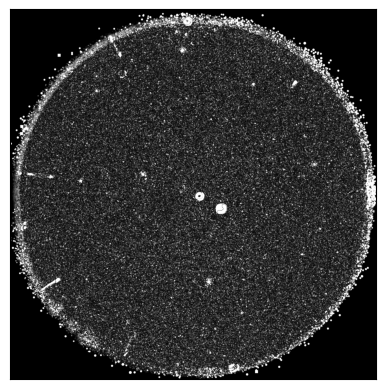

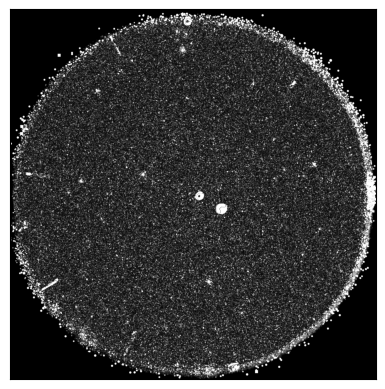

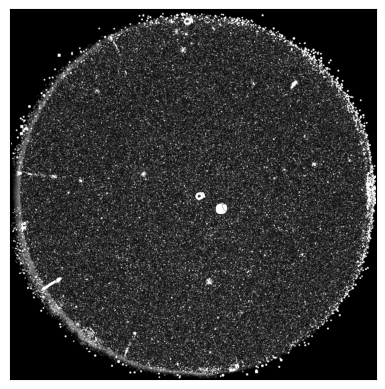

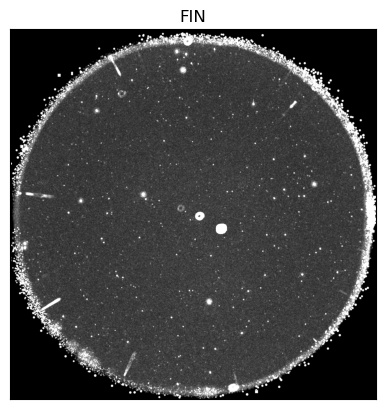

In [59]:
from scipy.ndimage import gaussian_filter
sigma = 3
cumulative = np.zeros(np.shape(image))
for i in tqdm(range(movie_data['COUNT_HEADER']['NAXIS3'])):
    plt.figure()
    # Apply Gaussian filter to the image and movie frames
    diff = np.abs((gaussian_filter(image, sigma=sigma) / exptime) - (gaussian_filter(movie[i], sigma=sigma) / exptimes[i]))
    plt.imshow(ZScaleInterval()(diff), cmap='gray', origin='lower')
    plt.xticks([])
    plt.yticks([])
    cumulative += diff

plt.figure()
plt.title('FIN')
plt.imshow(ZScaleInterval()(cumulative), cmap='gray', origin='lower')
plt.xticks([])
plt.yticks([]);

In [52]:
from PIL import Image

movie_=[]
for frame in movie:
    image_pil = Image.fromarray(frame)
    # Resize the image (e.g., to 1024x1024)
    resized_image_pil = image_pil.resize((512, 512,))
    # Convert the resized PIL image back to a NumPy array
    frame_ = np.array(gaussian_filter(resized_image_pil, sigma=1))
    movie_.append(frame_)
movie_ = np.array(movie_)

print(f"Original shape: {movie.shape}, Resized shape: {movie_.shape}")



Original shape: (29, 3099, 3065), Resized shape: (29, 512, 512)

In [55]:
mask = np.zeros((512,512),dtype='bool')
for i,j in tqdm(itertools.product(range(512),range(512))): # 9498435 iterations
    img = movie_[:,i,j]
    if all(img==0):
        continue
    ad = anderson(movie_[:,i,j], dist='norm')
    if ad.statistic>=ad.critical_values[0]:
        mask[i,j] = True


262144it [01:41, 2594.69it/s]


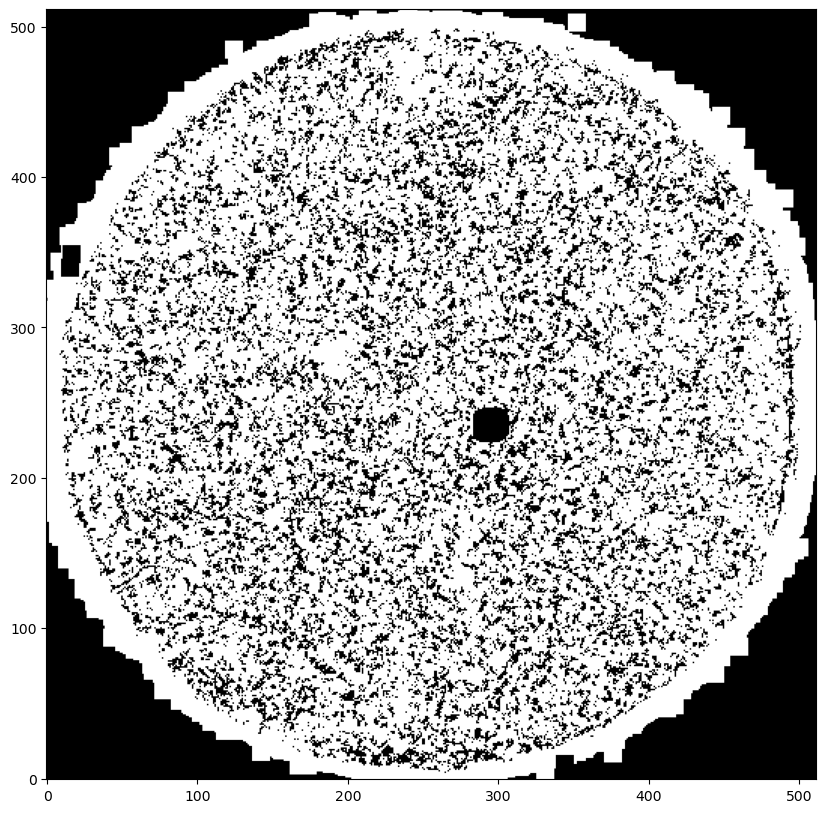

In [56]:
plt.figure(figsize=(10,10))
plt.imshow(mask,origin='lower',cmap='gray')

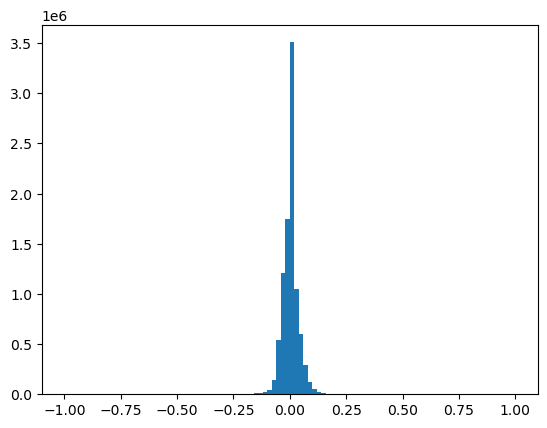

In [6]:
plt.hist(cumulative.flatten(),bins=100,range=[-1,1]);

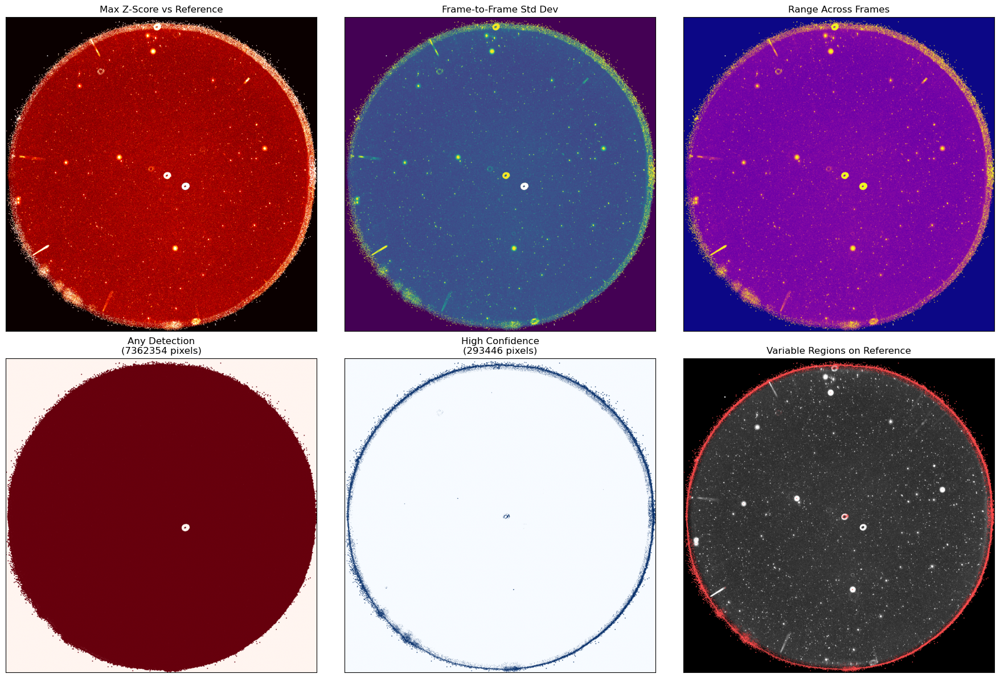

Detection Summary:

Any detection: 7362354 pixels

High confidence: 293446 pixels

Detection rate: 3.089%

In [57]:
from scipy.ndimage import gaussian_filter
from scipy import stats
import numpy as np

def improved_variability_detection(image, movie, exptime, exptimes, sigma=1.0):
    """
    Improved variability detection with multiple methods
    """
    # Normalize all data to count rates
    image_rate = gaussian_filter(image, sigma=sigma) / exptime
    movie_rates = np.array([gaussian_filter(movie[i], sigma=sigma) / exptimes[i] 
                           for i in range(len(exptimes))])
    
    # Method 1: Statistical comparison with reference image
    # Calculate z-scores for each movie frame vs reference
    z_scores = []
    for frame_rate in movie_rates:
        # Estimate noise from Poisson statistics
        noise_estimate = np.sqrt(np.maximum(image_rate, 1)) / exptime
        z_score = np.abs(frame_rate - image_rate) / (noise_estimate + 1e-10)
        z_scores.append(z_score)
    
    z_scores = np.array(z_scores)
    
    # Method 2: Frame-to-frame variability within movie
    frame_diffs = np.diff(movie_rates, axis=0)
    frame_std = np.std(frame_diffs, axis=0)
    frame_mean = np.mean(movie_rates, axis=0)
    
    # Method 3: Range-based detection
    movie_range = np.ptp(movie_rates, axis=0)  # peak-to-peak
    
    # Method 4: Coefficient of variation
    cv = frame_std / (frame_mean + 1e-10)
    
    # Create masks with adaptive thresholds
    # Threshold based on image statistics, not fixed percentiles
    
    # For z-scores: any frame significantly different from reference
    z_threshold = 3.0  # 3-sigma threshold
    z_mask = np.any(z_scores > z_threshold, axis=0)
    
    # For frame variability: use robust statistics
    robust_std_threshold = np.median(frame_std) + 2 * stats.median_abs_deviation(frame_std.flatten())
    frame_var_mask = frame_std > robust_std_threshold
    
    # For range: adaptive threshold based on typical photon noise
    expected_noise = np.sqrt(frame_mean + 1) / np.sqrt(np.mean(exptimes))
    range_threshold = 3 * expected_noise  # 3x expected noise level
    range_mask = movie_range > range_threshold
    
    # For CV: flag high relative variability
    cv_threshold = np.percentile(cv[np.isfinite(cv) & (cv > 0)], 95)
    cv_mask = cv > cv_threshold
    
    # Combine masks with different weights/priorities
    # High confidence: multiple methods agree
    high_confidence = (z_mask.astype(int) + frame_var_mask.astype(int) + 
                      range_mask.astype(int) + cv_mask.astype(int)) >= 2
    
    # Any detection: at least one method flags it
    any_detection = z_mask | frame_var_mask | range_mask | cv_mask
    
    return {
        'high_confidence_mask': high_confidence,
        'any_detection_mask': any_detection,
        'z_scores': z_scores,
        'frame_std': frame_std,
        'movie_range': movie_range,
        'cv': cv,
        'individual_masks': {
            'z_score': z_mask,
            'frame_variability': frame_var_mask,
            'range': range_mask,
            'coefficient_variation': cv_mask
        }
    }

# Apply improved detection
results = improved_variability_detection(image, movie, exptime, exptimes, sigma=1.0)

# Display results
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Top row: variability metrics
axes[0,0].imshow(ZScaleInterval()(np.max(results['z_scores'], axis=0)), 
                cmap='hot', origin='lower')
axes[0,0].set_title('Max Z-Score vs Reference')
axes[0,0].set_xticks([])
axes[0,0].set_yticks([])

axes[0,1].imshow(ZScaleInterval()(results['frame_std']), 
                cmap='viridis', origin='lower')
axes[0,1].set_title('Frame-to-Frame Std Dev')
axes[0,1].set_xticks([])
axes[0,1].set_yticks([])

axes[0,2].imshow(ZScaleInterval()(results['movie_range']), 
                cmap='plasma', origin='lower')
axes[0,2].set_title('Range Across Frames')
axes[0,2].set_xticks([])
axes[0,2].set_yticks([])

# Bottom row: masks
axes[1,0].imshow(results['any_detection_mask'], cmap='Reds', origin='lower')
axes[1,0].set_title(f'Any Detection\n({np.sum(results["any_detection_mask"])} pixels)')
axes[1,0].set_xticks([])
axes[1,0].set_yticks([])

axes[1,1].imshow(results['high_confidence_mask'], cmap='Blues', origin='lower')
axes[1,1].set_title(f'High Confidence\n({np.sum(results["high_confidence_mask"])} pixels)')
axes[1,1].set_xticks([])
axes[1,1].set_yticks([])

# Overlay on reference image
overlay = image.copy()
overlay_rgb = np.stack([overlay, overlay, overlay], axis=-1)
overlay_rgb = ZScaleInterval()(overlay_rgb)
overlay_rgb[results['high_confidence_mask'], 0] = 1.0  # Red
overlay_rgb[results['high_confidence_mask'], 1] = 0.3
overlay_rgb[results['high_confidence_mask'], 2] = 0.3

axes[1,2].imshow(overlay_rgb, origin='lower')
axes[1,2].set_title('Variable Regions on Reference')
axes[1,2].set_xticks([])
axes[1,2].set_yticks([])

plt.tight_layout()
plt.show()

print(f"Detection Summary:")
print(f"  Any detection: {np.sum(results['any_detection_mask'])} pixels")
print(f"  High confidence: {np.sum(results['high_confidence_mask'])} pixels") 
print(f"  Detection rate: {100*np.sum(results['high_confidence_mask'])/results['high_confidence_mask'].size:.3f}%")